# **YOLO V5 - THUDOGS DATASET**

# **1. Import libraries**

In [ ]:
import os, shutil
import torch
import xml.etree.ElementTree as ET

In [ ]:
print(torch.__version__)

1.7.1


# **2. Define paths and classes**

In [ ]:
numClassesYolo = 1
# Origin paths
# source
path = 'dataset/ThudogsDataset'
# images path
pathImagesOrigin = path + '/original/low-resolution'
# annotations
pathAnnotationOrigin = path + '/original/Low-annotations'

# Destination paths
# destination
pathYoloDataset = path + '/YoloDataset'
# images
pathYoloImages = pathYoloDataset + '/images'
# labels
pathYoloLabels = pathYoloDataset + '/labels'
#number of classes
classListOrigin = sorted(os.listdir(pathImagesOrigin))
numClassOrigin = len(classListOrigin)
print(numClassOrigin)
print(numClassesYolo)

130
1


# **3. Split dataset**
Only run one time correctly!

## **Split paths for each class of dataset and join**

In [ ]:
#split paths randomly in train, val and test
def split_class_dataset(path_dataset, test_split, val_split, manual_seed):
    total = len(path_dataset)
    num = int ((1-test_split)*total)
    train, test = torch.utils.data.random_split(path_dataset, [num,total-num], generator=torch.Generator().manual_seed(manual_seed))
    total = len(train)
    num = int ((1-val_split)*total)
    train, val = torch.utils.data.random_split(train, [num,total-num], generator=torch.Generator().manual_seed(manual_seed))
    return train, val, test

#split paths for each class in train, val, test
#then join
def split_dataset(class_list, pathData, test_split = 0.2, val_split = 0.1, manual_seed = 42):
    train, val, test = list(), list(), list()
    for class_name in class_list:
        base_name = pathData + "/{}/".format(class_name)
        list_image = os.listdir(base_name)
        list_image = [ base_name + item for item in list_image]
        train_aux, val_aux, test_aux = split_class_dataset(list_image, test_split, val_split, manual_seed)
        train += train_aux
        val += val_aux
        test += test_aux
    return train, val, test

In [ ]:
%%time
#run split dataset defined
test_split = 0.2
val_split = 0.1
manual_seed = 42
train, val, test = split_dataset(classListOrigin, pathImagesOrigin, test_split, val_split, manual_seed)
print(len(train)+len(test)+len(val))
print(len(train))
print(len(val))
print(len(test))
print('Examples')
print(train[0])
print(val[0])
print(test[0])

70428
50604
5685
14139
Examples
./dataset/ThudogsDataset/original/low-resolution/1043-n000001-Shiba_Dog/n100884.jpeg
./dataset/ThudogsDataset/original/low-resolution/1043-n000001-Shiba_Dog/n100694.jpeg
./dataset/ThudogsDataset/original/low-resolution/1043-n000001-Shiba_Dog/n100827.jpg
CPU times: user 56.2 ms, sys: 24.2 ms, total: 80.4 ms
Wall time: 332 ms


## **Run split into directories train, val and test**

In [ ]:
#util function: create directory if it doesn't exist
def createDir(pathDir):
    valid = False
    try:
        if not os.path.exists(pathDir):
            os.makedirs(pathDir)
        valid = True
    except Exception as e:
        print('Error creating directory {}'.format(pathDir))
        print(e)
    return valid

#util function: copy file
def copyFile(src, dst):
    valid = False
    try:
        shutil.copyfile(src, dst)
        valid = True
    except Exception as e:
        print('Error copying file {} to {}'.format(src,dst))
        print(e)
    return valid

#util function: get class name and filename from path file
def get_class_name(path):
  #/content/drive/MyDrive/Ciclos/21/Project FindPet/dataset/StanfordDataset/data/n02085620-Chihuahua/n02085620_11818.jpg
    fileName = path[path.rfind('/')+1:]
    className = path[:path.rfind('/')]
    className = className[className.rfind('/')+1:]
    return className, fileName
  
#util function: remove directory recursively
def remove_dir(dir):
    try:
        shutil.rmtree(dir)
    except Exception as e:
        print('Error removing directory {}'.format(dir))
        print(e)


In [ ]:
#create dataset from origin path to destination path
def create_dataset(oriPaths, dstPath, kindDataset):
    dirDst = dstPath + '/' + kindDataset
    print('{}: Starting...'.format(kindDataset))
    if not createDir(dirDst):
        print('{}: Error creating destination dataset {}'.format(kindDataset, dirDst))
        remove_dir(path)
        return False

    for path_img in oriPaths:
        className, imageName = get_class_name(path_img)
        dst = dirDst + '/' +   imageName
        if not copyFile(path_img, dst):
            print('{}: Error copying file {} to {}'.format(kindDataset, path_img, dst))
            remove_dir(path)
            return False
    print('{}: Finished {} files'.format(kindDataset, len(oriPaths)))
    return True


#create train, val and test dataset
def split_dir_dataset(train, val, test, dstPath):
    if create_dataset(train, dstPath, 'train') and create_dataset(val, dstPath, 'val') and create_dataset(test, dstPath, 'test'):
        return True
    return False

In [ ]:
%%time
#run and create train, val, and test dataset
dataset = split_dir_dataset(train, val, test, pathYoloImages)
print('Dataset created: {}'.format(dataset))

train: Starting...
train: Finished 50604 files
val: Starting...
val: Finished 5685 files
test: Starting...
test: Finished 14139 files
Dataset created: True
CPU times: user 2.06 s, sys: 3.13 s, total: 5.19 s
Wall time: 5.7 s


In [ ]:
#check number of files should be the same
!find ./dataset/ThudogsDataset/YoloDataset/images/train -type f | wc -l
!find ./dataset/ThudogsDataset/YoloDataset/images/val -type f | wc -l
!find ./dataset/ThudogsDataset/YoloDataset/images/test -type f | wc -l
!find ./dataset/ThudogsDataset/YoloDataset/images -type f | wc -l
!find ./dataset/ThudogsDataset/original/low-resolution -type f | wc -l

50604
5685
14139
70428
70428


# **4. Prepair dataset and annotations to Yolo v5**

In [ ]:
# normalization values 0-1
def normalization(xmin, xmax, ymin, ymax, width, height):
    # return x_center, y_center, width, height
    return (xmin + xmax)/(2*width), (ymin + ymax)/(2*height), (xmax-xmin)/width, (ymax-ymin)/height

# get values xmin, xmax, ymin, ymax, width, height
def extract_annotation(file):
    try:
        tree = ET.parse(file)
        xmin = int(tree.getroot().findall('object')[0].find('headbndbox').find('xmin').text)
        xmax = int(tree.getroot().findall('object')[0].find('headbndbox').find('xmax').text)
        ymin = int(tree.getroot().findall('object')[0].find('headbndbox').find('ymin').text)
        ymax = int(tree.getroot().findall('object')[0].find('headbndbox').find('ymax').text)
        width = int(tree.getroot().findall('size')[0].find('width').text)
        height = int(tree.getroot().findall('size')[0].find('height').text)
        return True, xmin, xmax, ymin, ymax, width, height
    except Exception as e:
        print('Error extracting annotation for {}'.format(file))
        print(e)
        return False, 0, 0, 0, 0, 0, 0

# save annotations
def save_annotation(category, filePath, x_center, y_center, width, height):
    try:
        with open(filePath, mode="w") as label_file:
            label_file.write("{}\t{}\t{}\t{}\t{}".format(category, x_center, y_center, width, height))
        return True
    except Exception as e:
        print('Error saving annotation for {}-{}-{}-{}-{}-{}'.format(filePath, category, x_center, y_center, width, height))
        print(e)
        return False

# create and save annotations
def save_values_yolo(pathListImage, pathAnnotations, kindDataset, pathLabels):
    print('{}: Starting...'.format(kindDataset))
    dirDst = '{}/{}'.format(pathLabels, kindDataset)
    if not createDir(dirDst):
        print('{}: Error creating destination dataset {}'.format(kindDataset, dirDst))
        remove_dir(dirDst)
        return False 
    for pathImage in pathListImage:
        class_name, file_name = get_class_name(pathImage)
        path_annotation = '{}/{}/{}.xml'.format(pathAnnotations, class_name, file_name)
        ext, xmin, xmax, ymin, ymax, width, height = extract_annotation(path_annotation)
        if ext:
            x_center, y_center, width, height = normalization(xmin, xmax, ymin, ymax, width, height)
            path_annotation_dst = '{}/{}.txt'.format(dirDst, file_name.split('.')[0])
            if not save_annotation(0, path_annotation_dst, x_center, y_center, width, height):
                print('{}: Error save annotation file {} to {}'.format(kindDataset, pathImage, path_annotation_dst))
                return False
    print('{}: Finished {} files'.format(kindDataset, len(pathListImage)))
    #print(xmin, xmax, ymin, ymax, width, height)
    #print(normalization(xmin, xmax, ymin, ymax, width, height))

#create train, val and test dataset
def create_annotations(train, val, test, pathAnnotationOrigin, pathYoloLabels):
    if save_values_yolo(val, pathAnnotationOrigin, 'val', pathYoloLabels) and save_values_yolo(test, pathAnnotationOrigin, 'test', pathYoloLabels) and save_values_yolo(train, pathAnnotationOrigin, 'train', pathYoloLabels):
        return True
    return False

In [ ]:
%%time
#run and create train, val, and test dataset
annot = create_annotations(train, val, test, pathAnnotationOrigin, pathYoloLabels)
print('Annotations created: {}'.format(annot))

val: Starting...
val: Finished 5685 files
Annotations created: False
CPU times: user 389 ms, sys: 103 ms, total: 491 ms
Wall time: 491 ms


In [ ]:
annot=save_values_yolo(test, pathAnnotationOrigin, 'test', pathYoloLabels)
print('Annotations created: {}'.format(annot))

test: Starting...
test: Finished 14139 files
Annotations created: None


In [ ]:
annot=save_values_yolo(train, pathAnnotationOrigin, 'train', pathYoloLabels)
print('Annotations created: {}'.format(annot))

train: Starting...
train: Finished 50604 files
Annotations created: None


## **Check split**

In [ ]:
#check number of files should be the same
!find ./dataset/ThudogsDataset/YoloDataset/labels/train -type f | wc -l
!find ./dataset/ThudogsDataset/YoloDataset/labels/val -type f | wc -l
!find ./dataset/ThudogsDataset/YoloDataset/labels/test -type f | wc -l
!find ./dataset/ThudogsDataset/YoloDataset/labels -type f | wc -l
!find ./dataset/ThudogsDataset/original/low-resolution -type f | wc -l

50604
5685
14139
70428
70428


# **5. Install requirements**

In [ ]:
!pwd

/home/ec2-user/SageMaker


In [ ]:
%cd ./dataset/ThudogsDataset

/home/ec2-user/SageMaker/dataset/ThudogsDataset


In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 8213, done.
remote: Counting objects: 100% (525/525), done.
remote: Compressing objects: 100% (242/242), done.
remote: Total 8213 (delta 368), reused 414 (delta 283), pack-reused 7688
Receiving objects: 100% (8213/8213), 9.43 MiB | 45.10 MiB/s, done.
Resolving deltas: 100% (5666/5666), done.


In [ ]:
!pwd

/home/ec2-user/SageMaker/dataset/ThudogsDataset


In [ ]:
%cd yolov5/

/home/ec2-user/SageMaker/dataset/ThudogsDataset/yolov5


In [ ]:
!pip install -r requirements.txt

     |████████████████████████████████| 76 kB 7.4 MB/s  eta 0:00:01
     |████████████████████████████████| 6.0 MB 70.9 MB/s eta 0:00:01
     |████████████████████████████████| 781 kB 86.4 MB/s eta 0:00:01
     |████████████████████████████████| 97 kB 14.1 MB/s  eta 0:00:01
     |████████████████████████████████| 4.9 MB 71.8 MB/s eta 0:00:01
     |████████████████████████████████| 151 kB 100.6 MB/s eta 0:00:01
     |████████████████████████████████| 132 kB 114.2 MB/s eta 0:00:01
     |████████████████████████████████| 4.2 MB 99.3 MB/s eta 0:00:01
     |████████████████████████████████| 155 kB 118.6 MB/s eta 0:00:01
     |████████████████████████████████| 146 kB 124.6 MB/s eta 0:00:01
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/pytorch_latest_p36/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install albumentations

     |████████████████████████████████| 98 kB 13.6 MB/s eta 0:00:01
     |████████████████████████████████| 37.1 MB 52.1 MB/s eta 0:00:01
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/pytorch_latest_p36/bin/python -m pip install --upgrade pip' command.


# **6. Configure paths and classes**

In [ ]:
%cat ../YoloDataset/thudogs.yaml

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../YoloDataset  # dataset root dir
train: images/train  # train images (relative to 'path') 128 images
val: images/val  # val images (relative to 'path') 128 images
test: images/test # test images (optional)

# Classes
nc: 1  # number of classes
names: [ 'dog face' ]  # class names

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Device:' , device)

Device: cuda:0


# **7. Run Yolo v5 train**

In [ ]:
# Train YOLOv5s on thudgos for 5 epochs
!python train.py --img 640 --batch 16 --epochs 5 --data ../YoloDataset/thudogs.yaml --weights yolov5s.pt --name yolov5s_epoch5_size640_batch16

train: weights=yolov5s.pt, cfg=, data=../YoloDataset/thudogs.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=5, batch_size=16, img_size=[640], rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=False, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5s_epoch5_size640_batch16, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-294-gdd62e2d torch 1.7.1 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, trans

# **8. Results and Graphics**

In [ ]:
from utils.plots import plot_results 
plot_results(save_dir='runs/train/yolov5s_epoch5_size640_batch162')

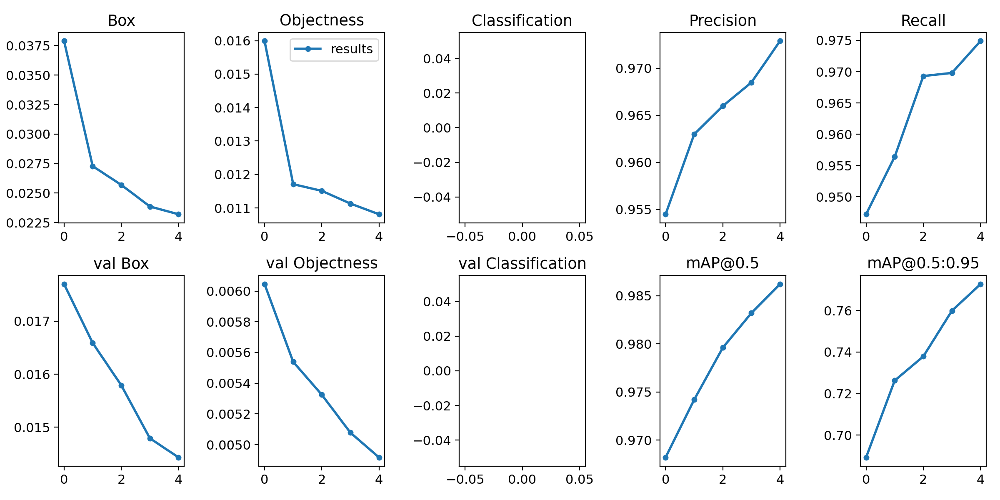

In [ ]:
from PIL import Image
Image.open('runs/train/yolov5s_epoch5_size640_batch162/results.png')

In [ ]:
createDir("./inference/images/")

True

In [ ]:
%cd ThudogsDataset/yolov5/

/home/ec2-user/SageMaker/dataset/ThudogsDataset/yolov5


In [ ]:
!find ../YoloDataset/images/val/ -maxdepth 1 -type f | head -50 | xargs cp -t "inference/images/"

find: `standard output': Broken pipe
find: write error


In [ ]:
!python detect.py --weights runs/train/yolov5s_epoch5_size640_batch162/weights/best.pt \
  --img 640 --conf 0.4 --source ./inference/images/

detect: weights=['runs/train/yolov5s_epoch5_size640_batch162/weights/best.pt'], source=./inference/images/, imgsz=640, conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-294-gdd62e2d torch 1.7.1 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients, 16.3 GFLOPs
image 1/50 /home/ec2-user/SageMaker/dataset/ThudogsDataset/yolov5/inference/images/n102336.jpg: 512x640 1 dog face, Done. (0.014s)
image 2/50 /home/ec2-user/SageMaker/dataset/ThudogsDataset/yolov5/inference/images/n103354.jpg: 448x640 1 dog face, Done. (0.013s)
image 3/50 /home/ec2-user/SageMaker/dataset/ThudogsDataset/yolov5/inference/images/n107537.jpg: 480x640 1 dog face, Done. (0.013s)
i

In [ ]:
def load_image(img_path, resize=True):
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (128, 256), interpolation = cv2.INTER_AREA)
    return img

def show_grid(image_paths):
    images = [load_image(img) for img in image_paths]
    images = torch.as_tensor(images)
    images = images.permute(0, 3, 1, 2)
    grid_img = torchvision.utils.make_grid(images, nrow=11)
    plt.figure(figsize=(24, 12))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.axis('off')

In [ ]:
from pathlib import Path
import os
import cv2
import torchvision
img_paths = [os.path.join('runs/detect/exp2', f) for f in os.listdir('runs/detect/exp2') if os.path.isfile(os.path.join('runs/detect/exp2', f))]
#list(Path("./inference/output").glob("*.*"))[:22]
%matplotlib inline
print(img_paths)

['runs/detect/exp2/n136355.jpeg', 'runs/detect/exp2/n145358.jpeg', 'runs/detect/exp2/n149231.jpeg', 'runs/detect/exp2/n128734.jpg', 'runs/detect/exp2/n129763.jpg', 'runs/detect/exp2/n160945.jpeg', 'runs/detect/exp2/n125839.jpeg', 'runs/detect/exp2/n133709.jpg', 'runs/detect/exp2/n102336.jpg', 'runs/detect/exp2/n135795.jpeg', 'runs/detect/exp2/n108629.jpg', 'runs/detect/exp2/n143930.jpg', 'runs/detect/exp2/n126308.jpg', 'runs/detect/exp2/n138121.jpeg', 'runs/detect/exp2/n168359.jpeg', 'runs/detect/exp2/n143670.jpeg', 'runs/detect/exp2/n158989.jpeg', 'runs/detect/exp2/n139113.jpeg', 'runs/detect/exp2/n134406.jpg', 'runs/detect/exp2/n161408.jpg', 'runs/detect/exp2/n127148.jpg', 'runs/detect/exp2/n132833.jpg', 'runs/detect/exp2/n166149.jpeg', 'runs/detect/exp2/n116545.jpg', 'runs/detect/exp2/n141200.jpg', 'runs/detect/exp2/n146763.jpeg', 'runs/detect/exp2/n143973.jpg', 'runs/detect/exp2/n126703.jpg', 'runs/detect/exp2/n128520.jpg', 'runs/detect/exp2/n168798.jpeg', 'runs/detect/exp2/n143000

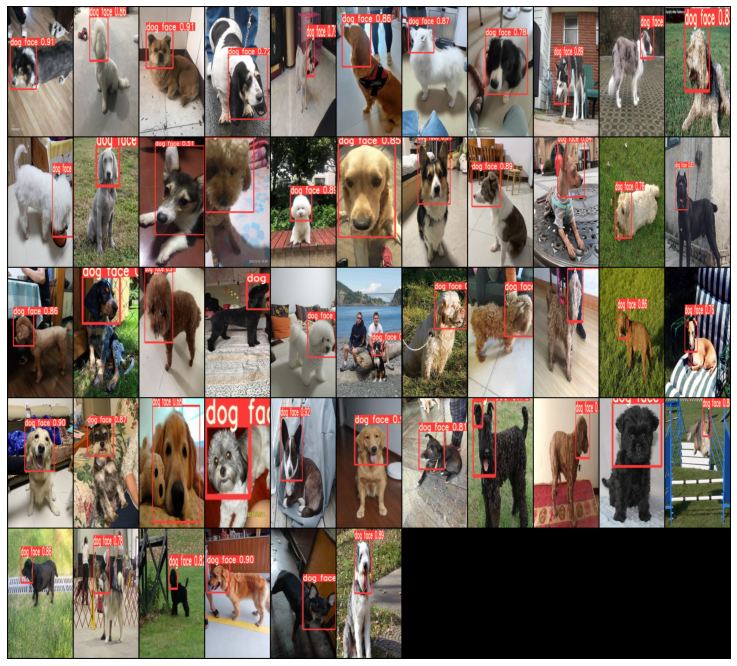

In [ ]:
show_grid(img_paths)

# **9. Upload files to S3**

In [ ]:
!pwd

/home/ec2-user/SageMaker/dataset/ThudogsDataset/yolov5


In [ ]:
!aws s3 cp . s3://find-pet-bucket/dataset/ThudogsDataset/yolov5 --recursive --include "*"

upload: .git/HEAD to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/HEAD    
upload: .git/FETCH_HEAD to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/FETCH_HEAD
upload: ./.dockerignore to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.dockerignore
upload: .git/hooks/applypatch-msg.sample to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/hooks/applypatch-msg.sample
upload: .git/description to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/description
upload: .git/hooks/commit-msg.sample to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/hooks/commit-msg.sample
upload: .git/hooks/pre-commit.sample to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/hooks/pre-commit.sample
upload: .git/config to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/config
upload: .git/hooks/pre-push.sample to s3://find-pet-bucket/dataset/ThudogsDataset/yolov5/.git/hooks/pre-push.sample
upload: .git/hooks/fsmonitor-watchman.sample to s3://find-pet-

In [ ]:
!aws s3 cp ../YoloDataset s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset --recursive --include "*"

upload: ../YoloDataset/images/test/n100021.jpg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100021.jpg
upload: ../YoloDataset/images/test/n100008.jpg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100008.jpg
upload: ../YoloDataset/images/test/n100012.jpg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100012.jpg
upload: ../YoloDataset/images/test/n100014.jpg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100014.jpg
upload: ../YoloDataset/images/test/n100026.jpeg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100026.jpeg
upload: ../YoloDataset/images/test/n100022.jpg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100022.jpg
upload: ../YoloDataset/images/test/n100032.jpeg to s3://find-pet-bucket/dataset/ThudogsDataset/YoloDataset/images/test/n100032.jpeg
upload: ../YoloDataset/images/test/n100003.jpeg to s3://find-pet-bucket/dataset/Thudog

# **10. Run train with others models of Yolo v5 (No complete)**

In [ ]:
!python train.py --img 640 --batch 16 --epochs 30 \
  --data ../YoloDataset/thudogs.yaml --weights yolov5x.pt \
  --name yolov5s_epoch30_size640_batch16 --cache

train: weights=yolov5x.pt, cfg=, data=../YoloDataset/thudogs.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=30, batch_size=16, img_size=[640], rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5s_epoch30_size640_batch16, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-294-gdd62e2d torch 1.7.1 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tran

In [ ]:
!python train.py --img 640 --batch 16 --epochs 30 \
  --data ../YoloDataset/thudogs.yaml --weights yolov5x.pt \
  --name yolov5x_epoch30_size640_batch16

train: weights=yolov5x.pt, cfg=, data=../YoloDataset/thudogs.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=30, batch_size=16, img_size=[640], rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=False, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5x_epoch30_size640_batch16, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-294-gdd62e2d torch 1.7.1 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tra